In [1]:
import os

import matplotlib.pyplot as plt
import pandas as pd
from jax import random
from PIL import Image
from splotch import get_input_data, register, run_nuts, run_svi
from splotch.visualization import (
    plot_annotations_in_common_coordinate_system,
    plot_annotations_on_slides,
    plot_coefficients,
    plot_rates_in_common_coordinate_system,
    plot_rates_on_slides,
    plot_variable_on_slides,
)

os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=8"

Image.MAX_IMAGE_PIXELS = 1000000000

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format='retina'

In [2]:
splotch_input_data = get_input_data(
    "metadata.tsv", 1, min_detection_rate=0.1, max_num_spots_per_tissue_section=400
)

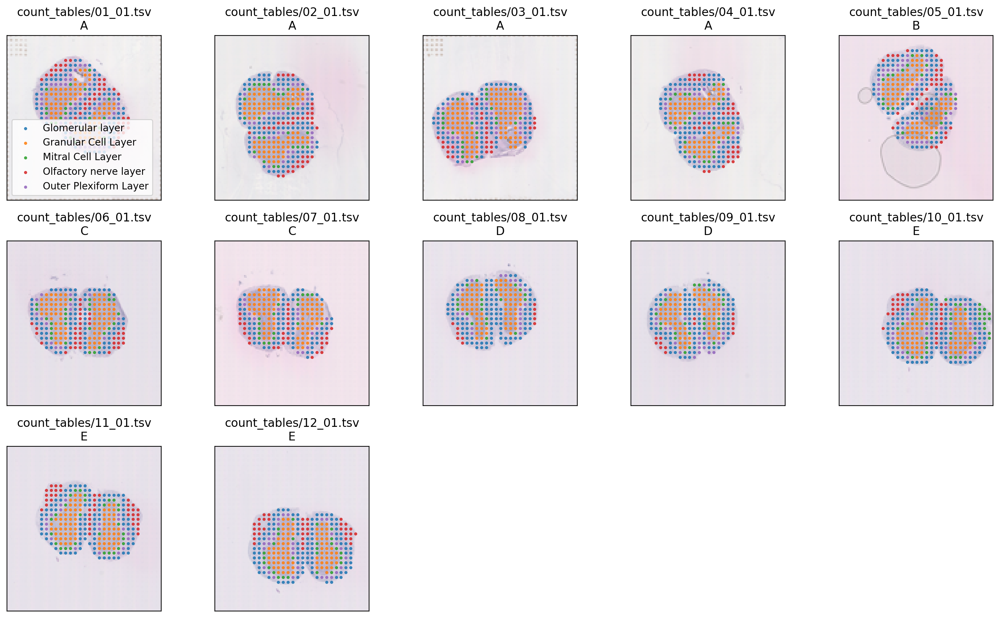

In [3]:
plot_annotations_on_slides(splotch_input_data);

In [4]:
key = random.PRNGKey(0)
key, key_ = random.split(key, 2)
register(key_, splotch_input_data, num_steps=10_000)

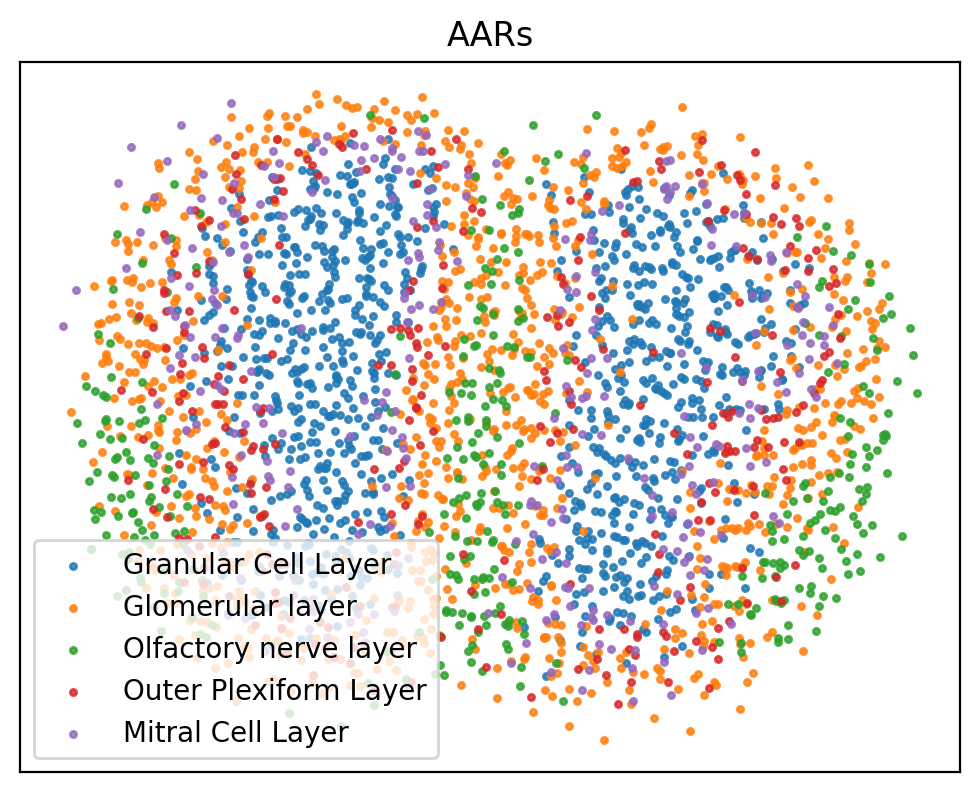

In [5]:
plot_annotations_in_common_coordinate_system(splotch_input_data);

In [6]:
splotch_input_data.metadata.groupby(["level_1"], observed=True).size().reset_index(
    name="num_spots"
).head()

,level_1,num_spots
0,A,1061
1,B,263
2,C,454
3,D,452
4,E,813


In [7]:
splotch_input_data.metadata.groupby(
    ["level_1", "aar"], observed=True
).size().reset_index(name="num_spots").head()

,level_1,aar,num_spots
0,A,Glomerular layer,336
1,A,Granular Cell Layer,365
2,A,Mitral Cell Layer,99
3,A,Olfactory nerve layer,137
4,A,Outer Plexiform Layer,124


## NUTS

In [8]:
key = random.PRNGKey(0)
key, key_ = random.split(key)

splotch_result_nuts_batch_1 = run_nuts(
    key_,
    ["Camk4", "Tubb6"],
    splotch_input_data,
    map_method="pmap",
    num_warmup=1_000,
    num_samples=1_000,
    num_chains=4,
)

splotch_result_nuts_batch_2 = run_nuts(
    key_,
    ["Dbx2"],
    splotch_input_data,
    map_method="pmap",
    num_warmup=1_000,
    num_samples=1_000,
    num_chains=4,
)

splotch_result_nuts = splotch_result_nuts_batch_1 + splotch_result_nuts_batch_2

In [9]:
pd.concat(
    [
        splotch_result_nuts.inference_metrics["summary"][k].query("r_hat > 1.05")
        for k in splotch_result_nuts.inference_metrics["summary"]
    ],
    axis=0,
)

,,mean,std,median,5.0%,95.0%,n_eff,r_hat
gene,index,,,,,,,


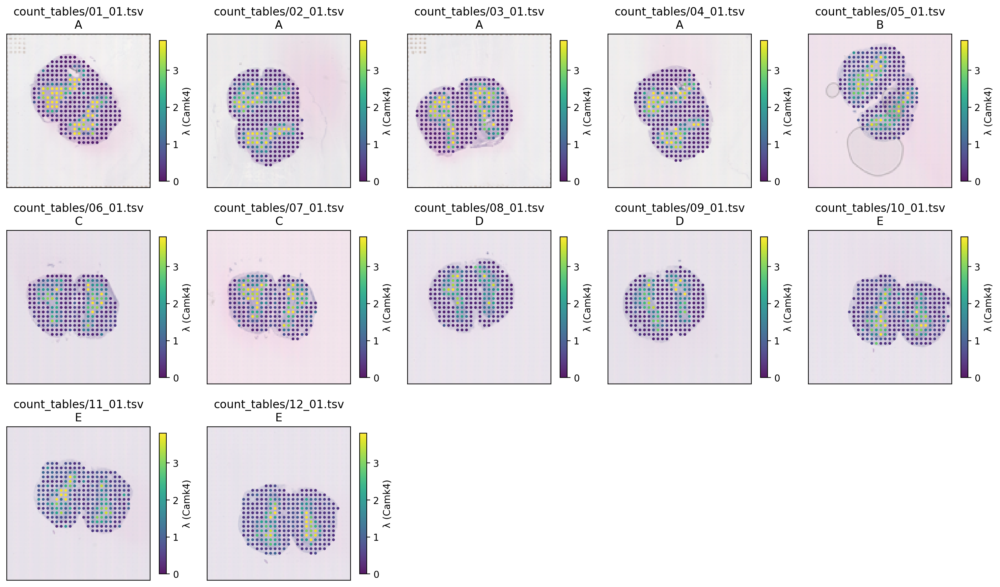

In [10]:
gene = "Camk4"

plot_rates_on_slides(splotch_result_nuts, gene);

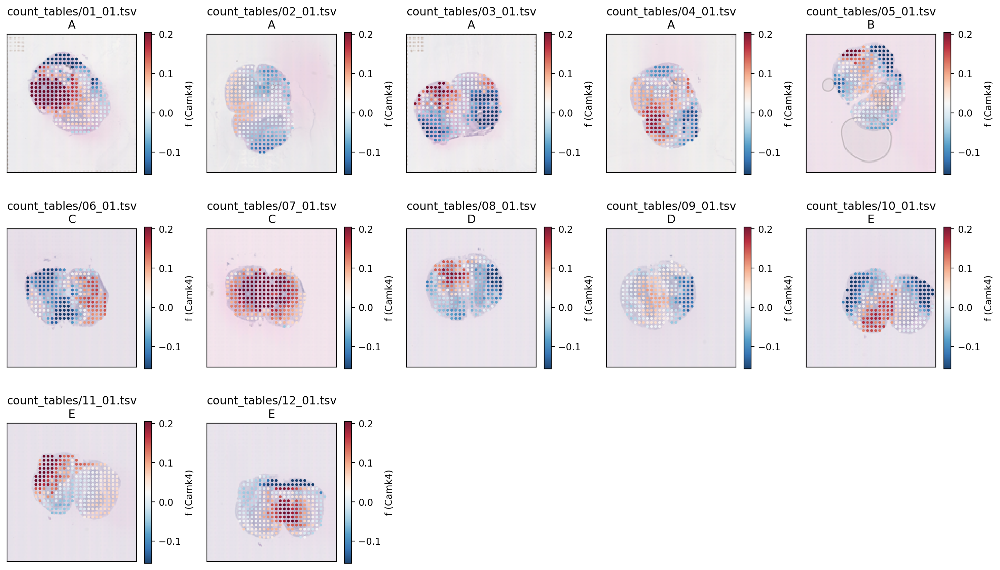

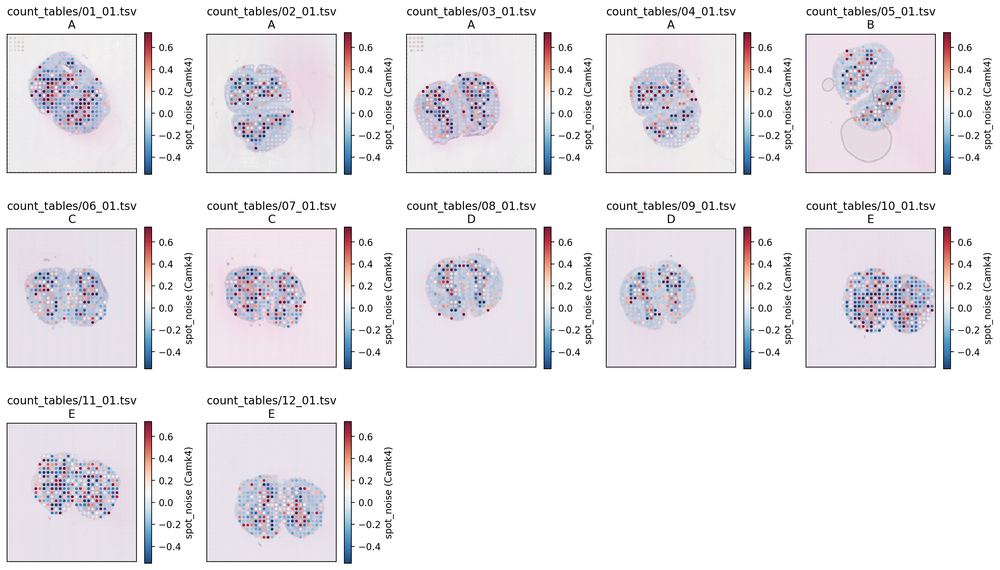

In [11]:
gene = "Camk4"

plot_variable_on_slides(splotch_result_nuts, gene, "f")
plot_variable_on_slides(splotch_result_nuts, gene, "spot_noise");

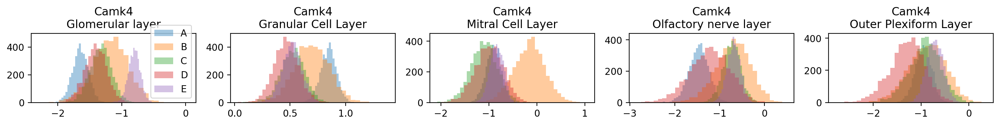

In [12]:
gene = "Camk4"

plot_coefficients(splotch_input_data, splotch_result_nuts, gene);

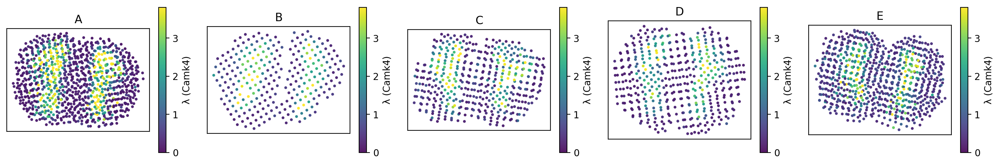

In [13]:
gene = "Camk4"

plot_rates_in_common_coordinate_system(splotch_result_nuts, gene);

## SVI

In [14]:
key = random.PRNGKey(0)
key, key_ = random.split(key)

splotch_result_svi_batch_1 = run_svi(
    key,
    ["Camk4", "Tubb6"],
    splotch_input_data,
    map_method="pmap",
    num_steps=10_000,
    num_samples=1_000,
)

splotch_result_svi_batch_2 = run_svi(
    key,
    ["Dbx2"],
    splotch_input_data,
    map_method="pmap",
    num_steps=10_000,
    num_samples=1_000,
)

splotch_result_svi = splotch_result_svi_batch_1 + splotch_result_svi_batch_2

In [16]:
splotch_result_svi = splotch_result_svi_batch_1 + splotch_result_svi_batch_2

Text(0.5, 0, 'Iteration')

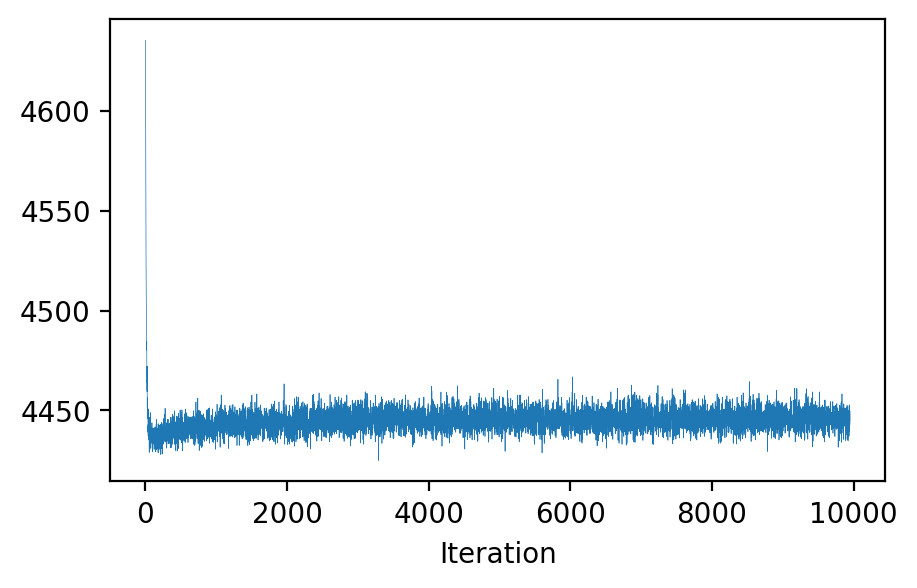

In [17]:
fig = plt.figure()
fig.set_size_inches(5, 3)

ax = fig.add_subplot(1, 1, 1)

ax.plot(splotch_result_svi.inference_metrics["losses"][0, 50:], lw=0.25)
ax.set_xlabel("Iteration")

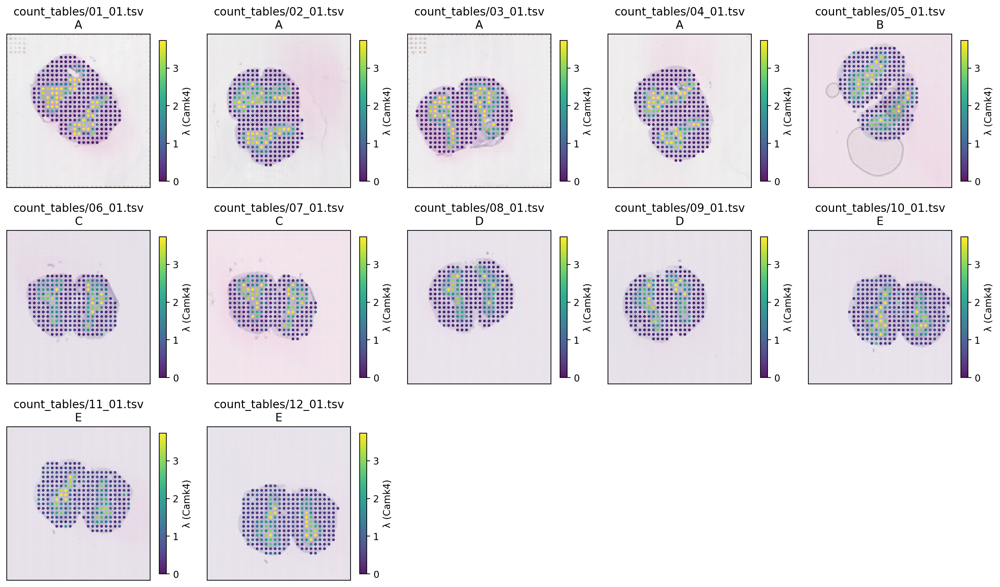

In [18]:
gene = "Camk4"

plot_rates_on_slides(splotch_result_svi, gene);

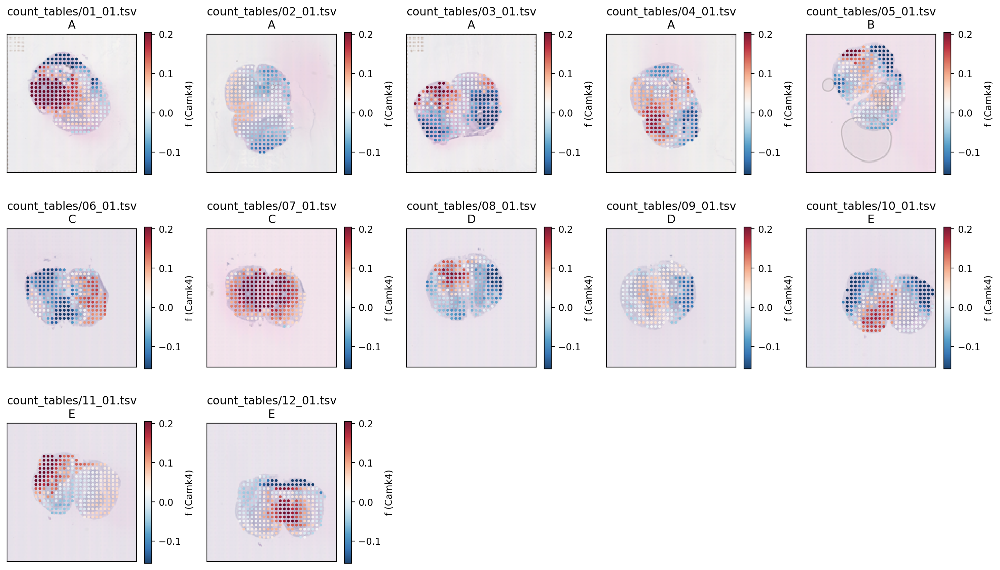

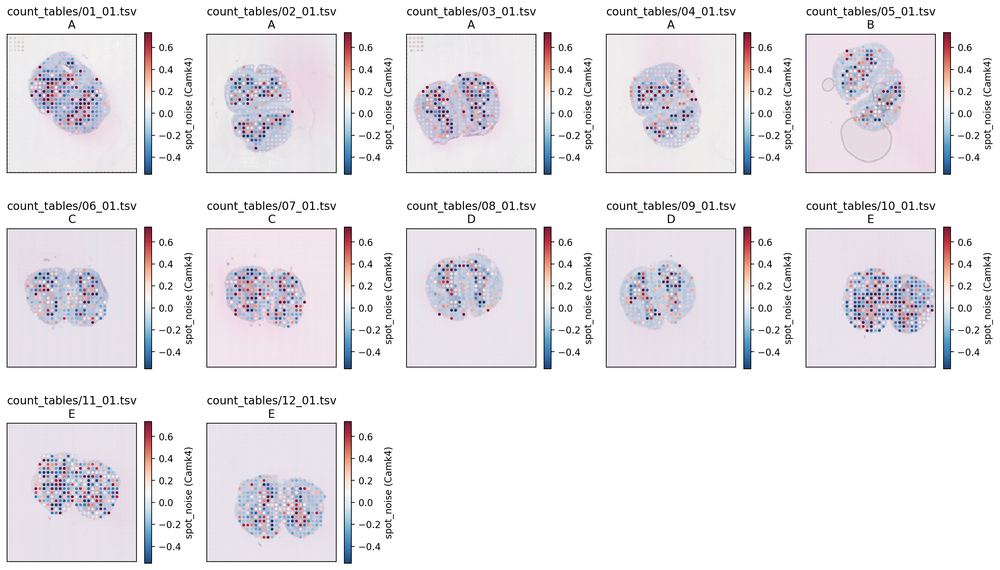

In [19]:
gene = "Camk4"

plot_variable_on_slides(splotch_result_nuts, gene, "f")
plot_variable_on_slides(splotch_result_nuts, gene, "spot_noise");

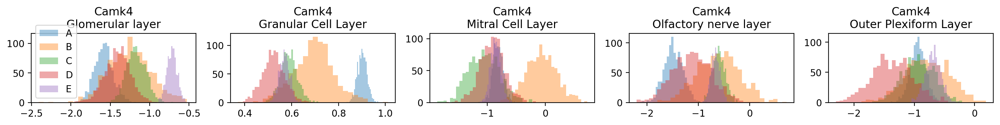

In [20]:
gene = "Camk4"

plot_coefficients(splotch_input_data, splotch_result_svi, gene);

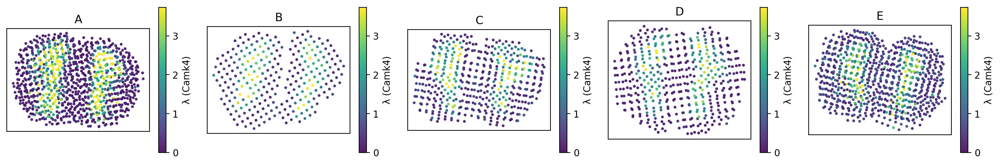

In [21]:
gene = "Camk4"

plot_rates_in_common_coordinate_system(splotch_result_svi, gene);